# Problem Statement
Pada kesempatan ini saya mencoba membuat klasifikasi tanaman pisang dan singkong menggunakan 2 metode yaitu membuat model sendiri dari awal dan menggunakan pre-trained model atau yang biasa disebut Transfer Learning. Saya ingin mencoba langsung membandingkan bagaimana hasil dari kedua metode tersebut.

Jenis klasifikasi yang digunakan di sini adalah Multiclass Classification (30 classes), dimana jika probabilitas nya lebih besar dari 0.5 maka gambar yang diprediksi adalah singkong dan jika probabilitas dibawah 0.5 hasil prediksinya adalah pisang.

# Impor Library yang diperlukan

In [1]:
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import requests
import kagglehub
import ipywidgets as widgets
from IPython.display import display
import io

# Persiapan Dataset

In [2]:

import kagglehub

# Download latest version
path = kagglehub.dataset_download("mdwaquarazam/agricultural-crops-image-classification")

print("Path to dataset files:", path)

100%|██████████| 79.0M/79.0M [00:05<00:00, 15.8MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mdwaquarazam/agricultural-crops-image-classification/versions/1


In [3]:
import os

In [4]:
classes = os.listdir(path+"/Agricultural-crops")

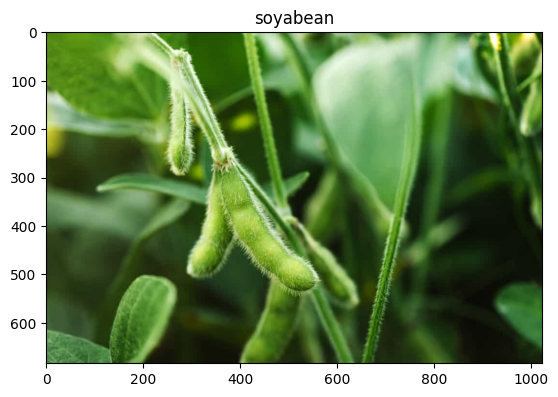

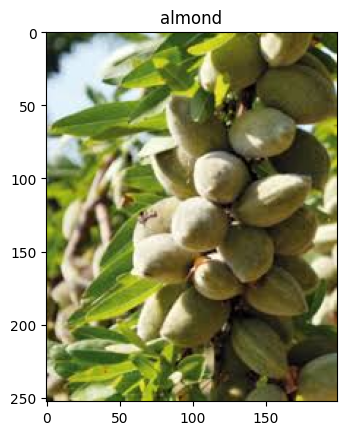

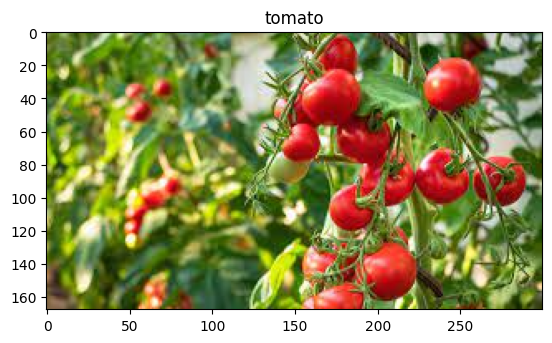

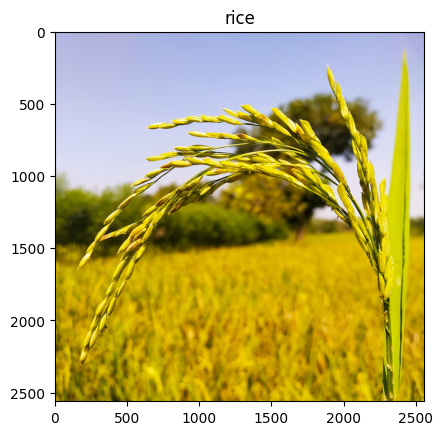

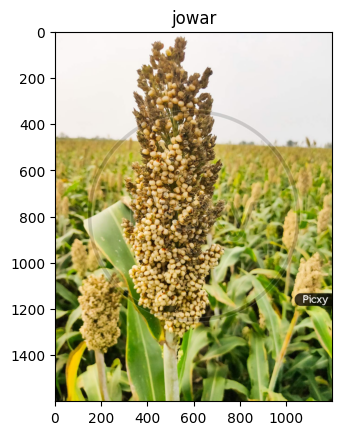

...

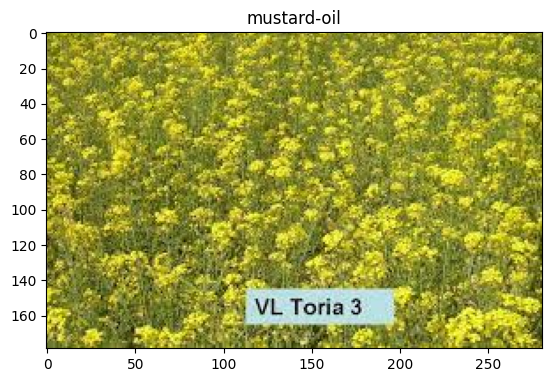

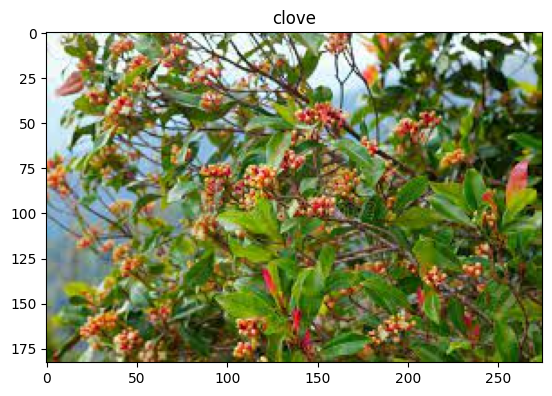

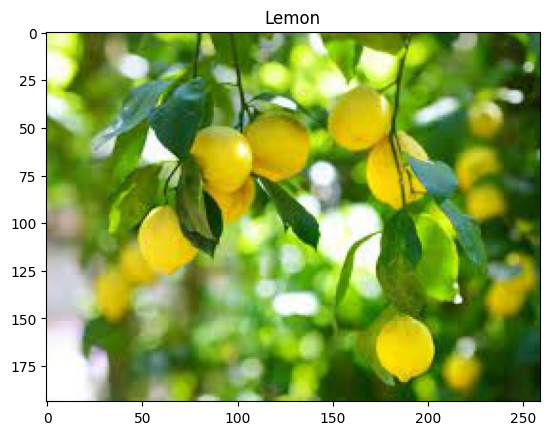

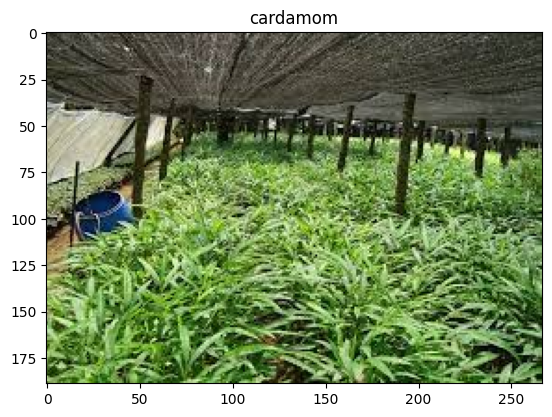

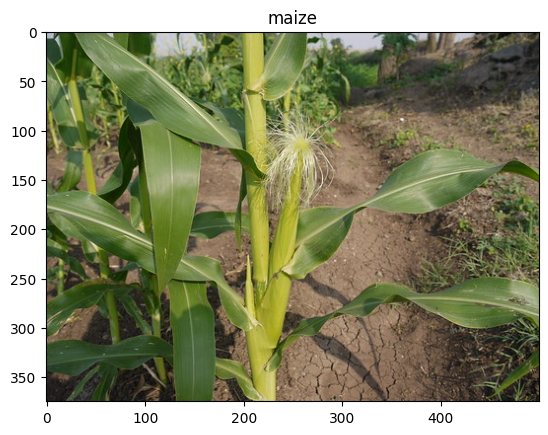

In [5]:
BASE_DIR = path + '/Agricultural-crops'

for i in range(len(classes)):
   img = tf.keras.utils.load_img(BASE_DIR +"/" +classes[i] +"/"+ os.listdir(BASE_DIR +"/" +classes[i])[0])

   plt.imshow(img)
   plt.title(classes[i])
   plt.show()

In [7]:
# Melakukan pemeriksaan file gambar dan mengonversi ke format yang sesuai



# Fungsi untuk memeriksa file gambar
def verify_and_fix_images(directory):
    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            if file_path.lower().endswith(".jpg"):
                try:
                    # Coba buka gambar dengan PIL untuk memastikan formatnya benar
                    with Image.open(file_path) as img:
                        img.verify()  # Verifikasi apakah benar-benar gambar

                    # Buka ulang gambar setelah verifikasi
                    with Image.open(file_path) as img:
                        img = img.convert("RGB")  # Konversi ke RGB jika perlu
                        img.save(file_path, "JPEG")  # Simpan ulang sebagai JPEG
                except (IOError, SyntaxError) as e:
                    print(f"Gambar tidak valid ditemukan dan dihapus: {file_path}")
                    os.remove(file_path)  # Hapus gambar yang tidak valid

# Jalankan fungsi untuk memeriksa dan memperbaiki gambar
verify_and_fix_images(BASE_DIR)
print("Pemeriksaan dan konversi gambar selesai.")


Pemeriksaan dan konversi gambar selesai.


In [19]:
# Memisahkan dataset menjadi Training dan Validation

train_dataset, validation_dataset = tf.keras.utils.image_dataset_from_directory(
          directory=BASE_DIR,
          image_size=(200,200),
          batch_size=32,
          validation_split=0.2,
          seed=23,
          subset='both'
)

# Optimisasi dataset

BUFFER_SIZE = 20

train_dataset_final = train_dataset.cache().shuffle(BUFFER_SIZE).prefetch(tf.data.AUTOTUNE)
validation_dataset_final = validation_dataset.cache().prefetch(tf.data.AUTOTUNE)

Found 829 files belonging to 30 classes.
Using 664 files for training.
Using 165 files for validation.


# Membuat model klasifikasi tanaman tanpa menggunakan Transfer Learning

In [9]:
# Membuat model untuk Image Augmentation

img_aug = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(200,200,3)),
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomTranslation(0.2,0.2, fill_mode='nearest'),
    tf.keras.layers.RandomZoom(0.2, fill_mode='nearest'),
    tf.keras.layers.RandomRotation(0.1, fill_mode='nearest')
])

In [38]:
# Membuat model klasifikasi gambar menggunakan convolutional neural network (tanpa transfer learning)

model_aug = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(200,200,3)),
    img_aug,
    tf.keras.layers.Rescaling(scale=1./255),

    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    #tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
    #tf.keras.layers.MaxPooling2D(2,2),

    #tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    #tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(30, activation='softmax'),
])

model_aug.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [21]:
# Membuat callback untuk menghentikan proses training ketika akurasi tercapai

class MyCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    if logs['accuracy'] >= 0.95 and logs['val_accuracy'] >= 0.95:
      self.model.stop_training = True
      print(f'\nModel sudah mencapai akurasi 95%. Proses training dihentikan.')

In [39]:
# Training model yang telah dibuat

history_model_aug = model_aug.fit(train_dataset_final, validation_data=validation_dataset_final, epochs=30, callbacks=[MyCallback()])


Epoch 1/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.0298 - loss: 3.4783 - val_accuracy: 0.0303 - val_loss: 3.4056
Epoch 2/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - accuracy: 0.0546 - loss: 3.3830 - val_accuracy: 0.0727 - val_loss: 3.3952
Epoch 3/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.0677 - loss: 3.2505 - val_accuracy: 0.1091 - val_loss: 3.2787
Epoch 4/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.0896 - loss: 3.1571 - val_accuracy: 0.1030 - val_loss: 3.1980
Epoch 5/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.1343 - loss: 3.0162 - val_accuracy: 0.1212 - val_loss: 3.0750
Epoch 6/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.1411 - loss: 2.9904 - val_accuracy: 0.1758 - val_loss: 2.9458
Epoch 7/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - accuracy: 0.1720 - loss: 2.8043 - val_accuracy: 0.1333 - val_loss: 2.9100
Epoch 8/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.1504 - loss: 2.7295 - val_accuracy: 0.2000 - v

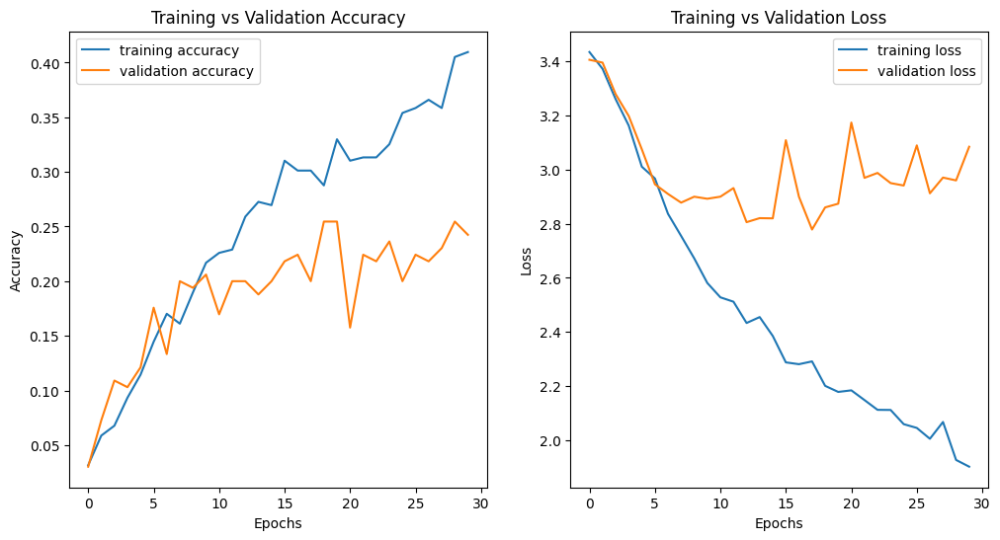

In [40]:
acc_1 = history_model_aug.history['accuracy']
val_acc_1 = history_model_aug.history['val_accuracy']
loss_1 = history_model_aug.history['loss']
val_loss_1 = history_model_aug.history['val_loss']
epoch = len(acc_1)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))

ax[0].plot(range(epoch), acc_1, label='training accuracy')
ax[0].plot(range(epoch), val_acc_1, label='validation accuracy')
ax[0].legend()
ax[0].set_title('Training vs Validation Accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epochs')

ax[1].plot(range(epoch), loss_1, label='training loss')
ax[1].plot(range(epoch), val_loss_1, label='validation loss')
ax[1].legend()
ax[1].set_title('Training vs Validation Loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epochs')

fig.show()

# Membuat model klasifikasi tanaman menggunakan Transfer Learning

In [46]:
# Menyiapkan pre-trained model

# Memuat file weights model
weights_file = '/content/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

# Inisiasi base model
pretrained_model = tf.keras.applications.inception_v3.InceptionV3(
    input_shape=(200,200,3),
    include_top=False,
    weights='imagenet'
)

# Memuat weights yang telah didownload ke base model
# pretrained_model.load_weights(weights_file)

# Mengatur agar parameter tidak dapat di-retrain
for layer in pretrained_model.layers:
  layer.trainable = False


In [44]:
pretrained_model.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11            │ (None, 200, 200, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_212 (Conv2D)       │ (None, 99, 99, 32)     │            864 │ input_layer_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_188   │ (None, 99, 99, 32)     │             96 │ conv2d_212[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_188            │ (None, 99, 99, 32)     │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_213 (Conv2D)       │ (None, 97, 97, 32)     │          9,216 │ activation_188[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_189   │ (None, 97, 97, 32)     │             96 │ conv2d_213[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_189            │ (None, 97, 97, 32)     │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_214 (Conv2D)       │ (None, 97, 97, 64)     │         18,432 │ activation_189[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_190   │ (None, 97, 97, 64)     │            192 │ conv2d_214[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_190            │ (None, 97, 97, 64)     │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_32          │ (None, 48, 48, 64)     │              0 │ activation_190[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_215 (Conv2D)       │ (None, 48, 48, 80)     │          5,120 │ max_pooling2d_32[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_191   │ (None, 48, 48, 80)     │            240 │ conv2d_215[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_191            │ (None, 48, 48, 80)     │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_216 (Conv2D)  

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 21,802,784 (83.17 MB)

In [59]:
# mengambil hanya sampai layer 'mixed7' dari pre-trained model
last_layer = pretrained_model.get_layer('mixed9')
last_output = last_layer.output

In [60]:
# Membuat Dense Neural Network sendiri

x = tf.keras.layers.Flatten()(last_output)

x = tf.keras.layers.Dense(256, activation='relu')(x)

x = tf.keras.layers.Dropout(0.2)(x)

x = tf.keras.layers.Dense(128, activation='relu')(x)

x = tf.keras.layers.Dense(30, activation='softmax')(x)

model_tf = tf.keras.Model(pretrained_model.input, x)

model_tf.summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13            │ (None, 200, 200, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_400 (Conv2D)       │ (None, 99, 99, 32)     │            864 │ input_layer_13[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_376   │ (None, 99, 99, 32)     │             96 │ conv2d_400[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_376            │ (None, 99, 99, 32)     │              0 │ batch_normalization_3… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_401 (Conv2D)       │ (None, 97, 97, 32)     │          9,216 │ activation_376[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_377   │ (None, 97, 97, 32)     │             96 │ conv2d_401[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_377            │ (None, 97, 97, 32)     │              0 │ batch_normalization_3… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_402 (Conv2D)       │ (None, 97, 97, 64)     │         18,432 │ activation_377[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_378   │ (None, 97, 97, 64)     │            192 │ conv2d_402[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_378            │ (None, 97, 97, 64)     │              0 │ batch_normalization_3… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_40          │ (None, 48, 48, 64)     │              0 │ activation_378[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_403 (Conv2D)       │ (None, 48, 48, 80)     │          5,120 │ max_pooling2d_40[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_379   │ (None, 48, 48, 80)     │            240 │ conv2d_403[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_379            │ (None, 48, 48, 80)     │              0 │ batch_normalization_3… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_404 (Conv2D)  

 Total params: 24,148,350 (92.12 MB)

 Trainable params: 8,425,630 (32.14 MB)

 Non-trainable params: 15,722,720 (59.98 MB)

In [61]:
# Membuat augmentasi untuk transfered model
data_aug = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomTranslation(0.2,0.2, fill_mode='nearest'),
    tf.keras.layers.RandomZoom(0.2, fill_mode='nearest'),
    tf.keras.layers.RandomRotation(0.1, fill_mode='nearest')
])

inputs = tf.keras.layers.Input(shape=(200,200,3))
x = data_aug(inputs)
x = model_tf(x)

model_tf_with_aug = tf.keras.Model(inputs, x)

In [62]:
# Melakukan rescaling image array menjadi rentang -1,1
def preprocess(image, label):
  image = tf.keras.applications.inception_v3.preprocess_input(image)
  return image, label

train_dataset_scaled = train_dataset.map(preprocess)
validation_dataset_scaled = validation_dataset.map(preprocess)

# Optimasi dataset untuk model transfer learning
train_scaled_final = train_dataset_scaled.cache().shuffle(BUFFER_SIZE).prefetch(tf.data.AUTOTUNE)
validation_scaled_final = validation_dataset_scaled.cache().prefetch(tf.data.AUTOTUNE)

In [63]:
# Meng-compile model
model_tf_with_aug.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Melatih model
history_tf = model_tf_with_aug.fit(train_scaled_final, validation_data=validation_scaled_final, epochs=30, callbacks=[MyCallback()])

Epoch 1/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.0872 - loss: 3.4842 - val_accuracy: 0.3273 - val_loss: 2.5307
Epoch 2/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.3839 - loss: 2.3729 - val_accuracy: 0.4545 - val_loss: 1.9646
Epoch 3/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.4713 - loss: 1.7748 - val_accuracy: 0.5818 - val_loss: 1.6096
Epoch 4/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.5636 - loss: 1.4336 - val_accuracy: 0.5636 - val_loss: 1.5228
Epoch 5/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.6646 - loss: 1.1454 - val_accuracy: 0.6545 - val_loss: 1.3525
Epoch 6/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - accuracy: 0.7375 - loss: 0.8843 - val_accuracy: 0.6788 - val_loss: 1.3027
Epoch 7/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - accuracy: 0.7489 - loss: 0.8817 - val_accuracy: 0.6121 - val_loss: 1.4810
Epoch 8/30
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7302 - loss: 0.8632 - val_accuracy: 0.6606 -

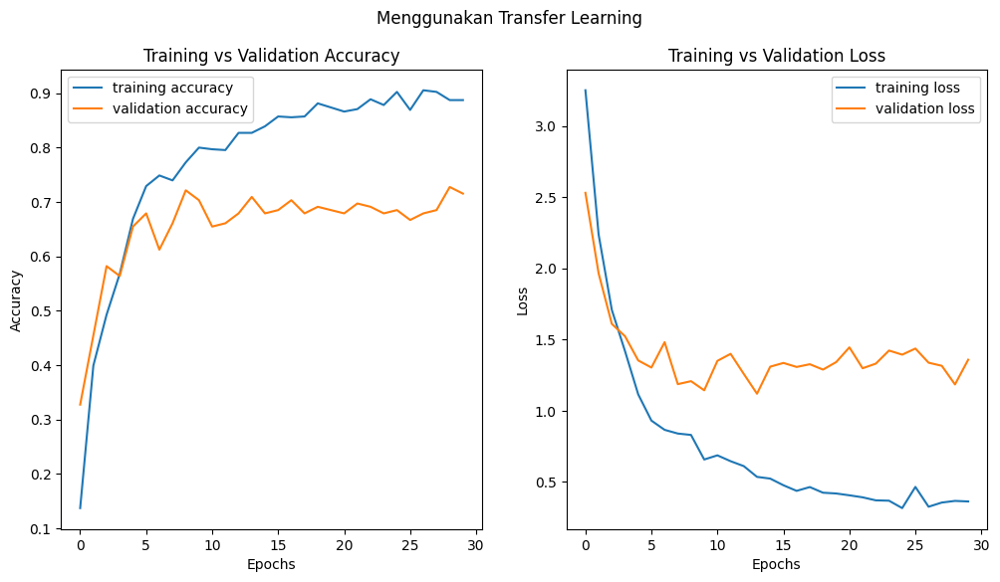

In [64]:
acc_2 = history_tf.history['accuracy']
val_acc_2 = history_tf.history['val_accuracy']
loss_2 = history_tf.history['loss']
val_loss_2 = history_tf.history['val_loss']
epoch = len(acc_2)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))

ax[0].plot(range(epoch), acc_2, label='training accuracy')
ax[0].plot(range(epoch), val_acc_2, label='validation accuracy')
ax[0].legend()
ax[0].set_title('Training vs Validation Accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epochs')

ax[1].plot(range(epoch), loss_2, label='training loss')
ax[1].plot(range(epoch), val_loss_2, label='validation loss')
ax[1].legend()
ax[1].set_title('Training vs Validation Loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epochs')

plt.suptitle('Menggunakan Transfer Learning')
fig.show()

## Model Testing

FileUpload(value={}, accept='image/*', description='Upload', multiple=True)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Hasil prediksi: coconut, probabilitas: 0.7180718183517456


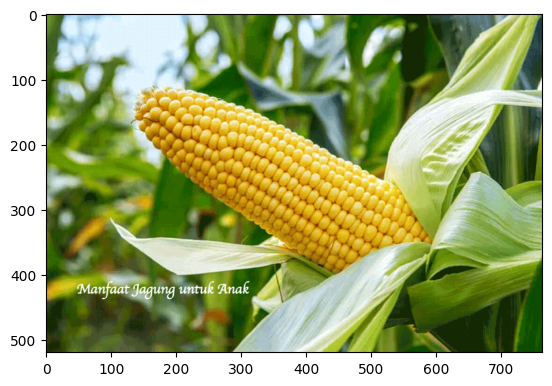

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Hasil prediksi: Lemon, probabilitas: 0.16604040563106537


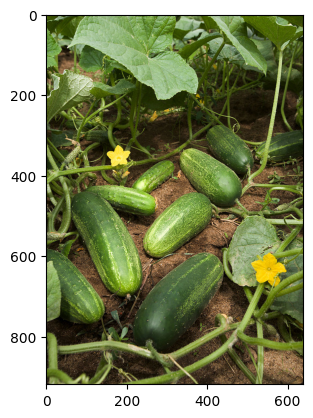

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Hasil prediksi: gram, probabilitas: 0.34661126136779785


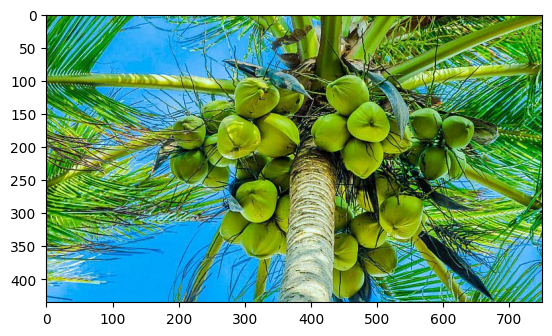

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Hasil prediksi: cardamom, probabilitas: 0.3533509075641632


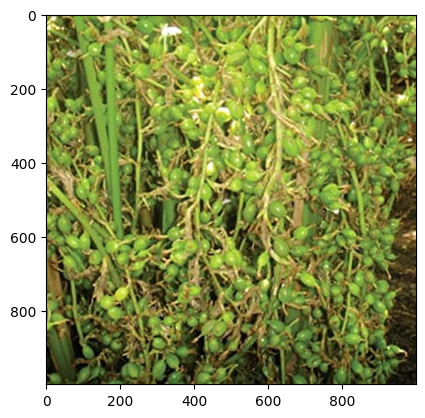

In [80]:

# Menggunakan model tanpa transfer learning

# Membuat widget upload
upload_widget = widgets.FileUpload(accept='image/*', multiple=True)
display(upload_widget)

# Fungsi untuk menangani unggahan dan melakukan prediksi
def on_upload_change(change):
    if upload_widget.value:
        # Mendapatkan data file yang diunggah
        file_info = list(upload_widget.value.values())[0]
        file_name = file_info['metadata']['name']
        file_content = file_info['content']

        # Membaca konten file sebagai bytes
        img_ = Image.open(io.BytesIO(file_content))
        img = img_.convert("RGB")  # Pastikan gambar dalam format RGB
        img = img.resize((200, 200))  # Ubah ukuran gambar sesuai kebutuhan model

        # Mengonversi gambar menjadi array numpy
        img_array = tf.keras.utils.img_to_array(img)  # Normalisasi
        img_array = np.array(img_array)
        # img_array = tf.keras.applications.inception_v3.preprocess_input(img_array)
        img_array = np.expand_dims(img_array, axis=0)  # Tambahkan dimensi batch

        # Memuat model dan melakukan prediksi
        prediction = model_aug.predict(img_array)

        # Menampilkan hasil prediksi
        predicted_class = validation_dataset.class_names[np.argmax(prediction)]
        print(f'Hasil prediksi: {predicted_class}, probabilitas: {np.max(prediction)}')
        plt.imshow(img_)

# Menghubungkan fungsi dengan widget upload
upload_widget.observe(on_upload_change, names='value')


Pada saat uji coba model, pada model tanpa menggunakan transfer learning, tingkat kaurasi sebesar 1/4, aertinya model ini hanya mampu memprediksi secara akurat 1 gambar tanaman sedangkan 3 gambar lainnya tidak mampu diprediksi secara akurat.

FileUpload(value={}, accept='image/*', description='Upload', multiple=True)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Hasil prediksi: maize, probabilitas: 1.0


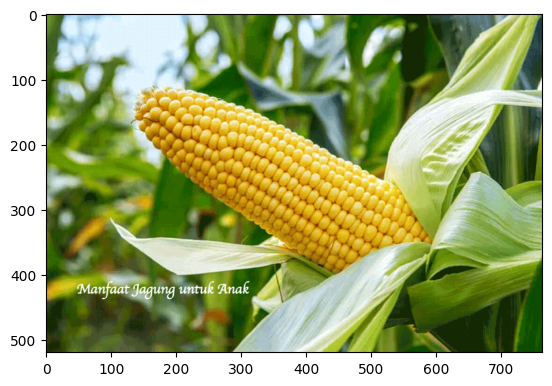

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Hasil prediksi: Cucumber, probabilitas: 0.9999927282333374


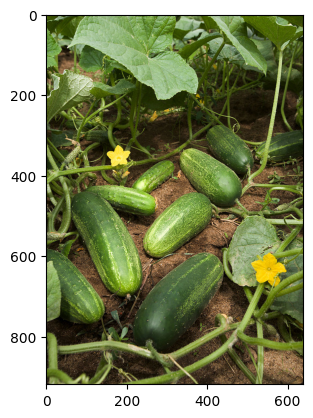

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Hasil prediksi: coconut, probabilitas: 0.9965682029724121


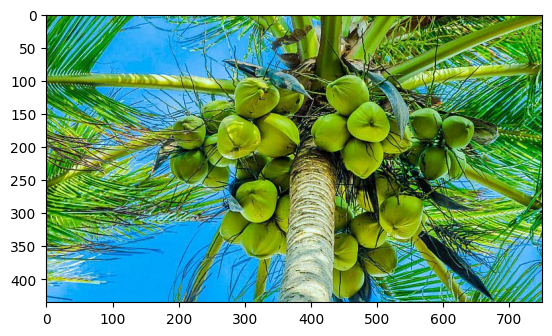

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Hasil prediksi: soyabean, probabilitas: 0.4978218674659729


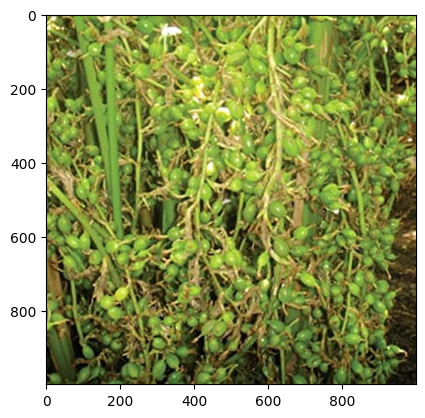

In [79]:

# Menggunakan model tanpa transfer learning

# Membuat widget upload
upload_widget = widgets.FileUpload(accept='image/*', multiple=True)
display(upload_widget)

# Fungsi untuk menangani unggahan dan melakukan prediksi
def on_upload_change(change):
    if upload_widget.value:
        # Mendapatkan data file yang diunggah
        file_info = list(upload_widget.value.values())[0]
        file_name = file_info['metadata']['name']
        file_content = file_info['content']

        # Membaca konten file sebagai bytes
        img_ = Image.open(io.BytesIO(file_content))
        img = img_.convert("RGB")  # Pastikan gambar dalam format RGB
        img = img.resize((200, 200))  # Ubah ukuran gambar sesuai kebutuhan model

        # Mengonversi gambar menjadi array numpy
        img_array = tf.keras.utils.img_to_array(img)  # Normalisasi
        img_array = np.array(img_array)
        img_array = tf.keras.applications.inception_v3.preprocess_input(img_array)
        img_array = np.expand_dims(img_array, axis=0)  # Tambahkan dimensi batch

        # Memuat model dan melakukan prediksi
        prediction = model_tf_with_aug.predict(img_array)

        # Menampilkan hasil prediksi
        predicted_class = validation_dataset.class_names[np.argmax(prediction)]
        print(f'Hasil prediksi: {predicted_class}, probabilitas: {np.max(prediction)}')
        plt.imshow(img_)

# Menghubungkan fungsi dengan widget upload
upload_widget.observe(on_upload_change, names='value')


Pada saat menguji model, pada model transfer learning, tingkat akurasi sebesar 3/4, artinya dari 4 gambar, yang diprediksi dengan benar sebanyak 3 gambar tanaman, dan 1 prediksi yang tidak akurat (Ekpektasi: cardamon, prediksi: soyabean).

# Kesimpulan
Penggunaan Transfer Learning mempermudah dalam membuat model yang efektif dengan waktu yang lebih singkat dibanding membuat model sendiri dari awal. Maka dari itu Transfer Learning sangat disarankan apabila kita ingin membuat sebuah model dengan dataset yang sedikit namun tingkat akurasi tinnggi. Walaupun pada latihan kali ini model kurang akurat dalam memprediksi tanaman, namun hal tersebut dapat disebabkan oleh kurangnya jumlah dataset dalam proses training sehingga terjadi underfitting.
